<a href="https://colab.research.google.com/github/Ishita95-harvad/Election-commission-of-India/blob/main/Election_Commission_of_India_ipyb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Election Commission of India


"6-State-Wise-Candidate-data-Summary.xlsx"

## Data loading

### Subtask:
Load the data from the Excel file "6-State-Wise-Candidate-data-Summary.xlsx" into a pandas DataFrame.


**Reasoning**:
Load the data from the Excel file into a pandas DataFrame.



In [ ]:
import pandas as pd

try:
    df = pd.read_excel('6-State-Wise-Candidate-data-Summary.xlsx')
    display(df.head())
except FileNotFoundError:
    print("Error: '6-State-Wise-Candidate-data-Summary.xlsx' not found.")
    df = None
except Exception as e:
    print(f"An error occurred: {e}")
    df = None

,6 - State Wise Candidate data Summary,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,STATE,NaN,NOMINATIONS FILED,NaN,NaN,NaN,NaN,NOMINATIONS REJECTED,NaN,NaN,...,CONTESTING CANDIDATES,NaN,NaN,NaN,NaN,DEPOSIT FORFIETED,NaN,NaN,NaN,NaN
4,NaN,CONSTITUENCY TYPE,NO. OF SEATS,M,F,TG,TOTAL,NaN,M,F,...,NaN,M,F,TG,TOTAL,NaN,M,F,TG,TOTAL


**Reasoning**:
The data seems to have a header spanning multiple rows.  We need to adjust the header correctly.



In [ ]:
# Adjust the header
new_header = df.iloc[3]
df = df[4:]
df.columns = new_header

# Display the first few rows of the adjusted DataFrame
display(df.head())

3,STATE,NaN,NOMINATIONS FILED,NaN,NaN,NaN,NaN,NOMINATIONS REJECTED,NaN,NaN,...,CONTESTING CANDIDATES,NaN,NaN,NaN,NaN,DEPOSIT FORFIETED,NaN,NaN,NaN,NaN
4,NaN,CONSTITUENCY TYPE,NO. OF SEATS,M,F,TG,TOTAL,NaN,M,F,...,NaN,M,F,TG,TOTAL,NaN,M,F,TG,TOTAL
5,Andhra Pradesh,GEN,20,490,70,0,560,NaN,116,34,...,NaN,338,31,0,369,NaN,303,26,0,329
6,Andhra Pradesh,SC,4,91,12,0,103,NaN,18,7,...,NaN,69,3,0,72,NaN,61,3,0,64
7,Andhra Pradesh,ST,1,18,5,0,23,NaN,7,1,...,NaN,9,4,0,13,NaN,9,2,0,11
8,Arunachal Pradesh,GEN,2,14,1,0,15,NaN,1,0,...,NaN,13,1,0,14,NaN,9,1,0,10


**Reasoning**:
The DataFrame still has some issues with the header.  The first two rows appear to be part of the header.  We need to combine them correctly and remove unnecessary rows.



In [ ]:
# Convert all elements to strings before concatenation
new_header = df.iloc[0].astype(str).fillna('') + ' ' + df.iloc[1].astype(str).fillna('')
df = df[2:]
df.columns = new_header

# Remove any remaining completely empty rows
df = df.dropna(how='all')

# Display the head to verify the result
display(df.head())

,nan Andhra Pradesh,CONSTITUENCY TYPE GEN,NO. OF SEATS 20,M 490,F 70,TG 0,TOTAL 560,nan nan,M 116,F 34,...,nan nan,M 338,F 31,TG 0,TOTAL 369,nan nan,M 303,F 26,TG 0,TOTAL 329
6,Andhra Pradesh,SC,4,91,12,0,103,NaN,18,7,...,NaN,69,3,0,72,NaN,61,3,0,64
7,Andhra Pradesh,ST,1,18,5,0,23,NaN,7,1,...,NaN,9,4,0,13,NaN,9,2,0,11
8,Arunachal Pradesh,GEN,2,14,1,0,15,NaN,1,0,...,NaN,13,1,0,14,NaN,9,1,0,10
9,Assam,GEN,11,121,12,0,133,NaN,11,1,...,NaN,108,10,0,118,NaN,87,7,0,94
10,Assam,SC,1,8,0,0,8,NaN,0,0,...,NaN,8,0,0,8,NaN,6,0,0,6


**Reasoning**:
The header is still not clean.  Many column names are still `nan` or contain unnecessary spaces.  We need to clean up the column names.



**Reasoning**:
I will explore the data by examining its shape, data types, missing values, descriptive statistics, unique values in categorical columns, and data distributions.  This will involve using methods like `.info()`, `.isnull().sum()`, `.describe()`, `.unique()`, `.value_counts()`, and creating histograms.



In [ ]:
# Clean up the column names
df.columns = [col.strip().replace('nan', '').replace('TOTAL TOTAL', 'TOTAL') for col in df.columns]
display(df.head())

,Andhra Pradesh,CONSTITUENCY TYPE GEN,NO. OF SEATS 20,M 490,F 70,TG 0,TOTAL 560,,M 116,F 34,...,,M 338,F 31,TG 0,TOTAL 369,,M 303,F 26,TG 0,TOTAL 329
6,Andhra Pradesh,SC,4,91,12,0,103,NaN,18,7,...,NaN,69,3,0,72,NaN,61,3,0,64
7,Andhra Pradesh,ST,1,18,5,0,23,NaN,7,1,...,NaN,9,4,0,13,NaN,9,2,0,11
8,Arunachal Pradesh,GEN,2,14,1,0,15,NaN,1,0,...,NaN,13,1,0,14,NaN,9,1,0,10
9,Assam,GEN,11,121,12,0,133,NaN,11,1,...,NaN,108,10,0,118,NaN,87,7,0,94
10,Assam,SC,1,8,0,0,8,NaN,0,0,...,NaN,8,0,0,8,NaN,6,0,0,6


## Data exploration

### Subtask:
Explore the loaded data to understand its structure, identify data types, check for missing values, and examine the distribution of key variables.


**Reasoning**:
I will explore the data by examining its shape, data types, missing values, descriptive statistics, unique values in categorical columns, and data distributions. I'll generate histograms for numerical and bar charts for categorical columns to visualize data distributions. I'll also provide initial observations about the data. This addresses all points in the subtask description.



In [5]:
import pandas as pd

In [6]:
import pandas as pd

# Create a pandas DataFrame
data = {'col1': [1, 2, 3], 'col2': [4, 5, 6]}
df = pd.DataFrame(data)

# Print the DataFrame
print(df)

   col1  col2
0     1     4
1     2     5
2     3     6


## Data wrangling

### Subtask:
Convert relevant columns to numeric types and handle inconsistencies.  Calculate summary statistics per state.


**Reasoning**:
Convert relevant columns to numeric types, handle inconsistencies, and calculate summary statistics per state.



In [ ]:
 import pandas as pd
import numpy as np

# Load the data into a pandas DataFrame
file_path = '6-State-Wise-Candidate-data-Summary.xlsx'  # or provide the full path

try:
    # Adjusted skiprows to 3 to include the header row
    df = pd.read_excel(file_path, skiprows=3)
except FileNotFoundError:
    print(f"Error: File not found at '{file_path}'. Please check the file path and ensure the file exists.")
    # Handle the error appropriately (e.g., exit the script or use a default DataFrame)
    df = pd.DataFrame()  # Create an empty DataFrame if file not found
except Exception as e:  # Handle other exceptions
    print(f"An error occurred while loading the file: {e}")
    # Handle the error (e.g., exit, use a default DataFrame)
    df = pd.DataFrame()  # Create an empty DataFrame for other errors

# Check if the DataFrame is empty before proceeding
if df.empty:
    print("DataFrame is empty. Check file loading or data source.")
else:
    # Set the header row - using iloc[0] to get the first row as header
    df.columns = df.iloc[0]
    # Remove the header row from the data
    df = df[1:]

    # ... (Rest of the data processing code)

Error: File not found at '6-State-Wise-Candidate-data-Summary.xlsx'. Please check the file path and ensure the file exists.
DataFrame is empty. Check file loading or data source.


In [ ]:
import pandas as pd
import numpy as np

# Load the data into a pandas DataFrame
file_path = '6-State-Wise-Candidate-data-Summary.xlsx'  # or provide the full path

try:
    # Adjusted skiprows to 3 to include the header row
    df = pd.read_excel(file_path, skiprows=3)
except FileNotFoundError:
    print(f"Error: File not found at '{file_path}'. Please check the file path and ensure the file exists.")
    # Handle the error appropriately (e.g., exit the script or use a default DataFrame)
    df = pd.DataFrame()  # Create an empty DataFrame if file not found
except Exception as e:  # Handle other exceptions
    print(f"An error occurred while loading the file: {e}")
    # Handle the error (e.g., exit, use a default DataFrame)
    df = pd.DataFrame()  # Create an empty DataFrame for other errors

# Check if the DataFrame is empty before proceeding
if df.empty:
    print("DataFrame is empty. Check file loading or data source.")
else:
    # Set the header row - using iloc[0] to get the first row as header
    # Check if the DataFrame has at least one row before accessing iloc[0]
    if df.shape[0] > 0:
        df.columns = df.iloc[0]
        # Remove the header row from the data
        df = df[1:]
    else:
        print("DataFrame is empty or has no rows after skipping rows. Check the skiprows argument.")

    # ... (Rest of the data processing code)

Error: File not found at '6-State-Wise-Candidate-data-Summary.xlsx'. Please check the file path and ensure the file exists.
DataFrame is empty. Check file loading or data source.


**Reasoning**:
The error persists, suggesting a fundamental issue with the data itself or how it's being accessed. I will inspect the data types again to see if the problem is that the columns still have mixed types.



In [ ]:
print(df.dtypes)

 Andhra Pradesh           object
CONSTITUENCY TYPE GEN     object
NO. OF SEATS 20          float64
M 490                    float64
F 70                     float64
TG 0                      object
TOTAL 560                 object
                          object
M 116                     object
F 34                      object
TG 0                      object
TOTAL 150                 object
                          object
M 36                      object
F 5                       object
TG 0                      object
TOTAL 41                  object
                          object
M 338                     object
F 31                      object
TG 0                      object
TOTAL 369                 object
                          object
M 303                     object
F 26                      object
TG 0                      object
TOTAL 329                 object
dtype: object


**Reasoning**:
The output shows that some columns are still objects, even after the previous attempts at conversion.  I'll try to convert the relevant columns to numeric using a more direct approach, ensuring that the data is treated as a string before conversion to handle potential inconsistencies.



In [ ]:
import pandas as pd
import numpy as np

# Identify numerical columns (excluding state and constituency type)
numerical_cols = ['NO. OF SEATS 20', 'M 490', 'F 70', 'TOTAL 560', 'M 116', 'F 34', 'TOTAL 150', 'M 36', 'F 5', 'TOTAL 41', 'M 338', 'F 31', 'TOTAL 369', 'M 303', 'F 26', 'TOTAL 329']

# Convert numerical columns to numeric, coercing errors to NaN
for col in numerical_cols:
    df[col] = pd.to_numeric(df[col].astype(str).str.replace('[^0-9.]', '', regex=True), errors='coerce')

# Handle inconsistencies (fill NaN with the mean for each column)
for col in numerical_cols:
    df[col].fillna(df[col].mean(), inplace=True)

# Group by state and calculate summary statistics
summary_stats = df.groupby(' Andhra Pradesh')[numerical_cols].agg(['mean', 'median', 'std', 'min', 'max'])

display(summary_stats)

<ipython-input-15-bb404d2261fa>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(df[col].mean(), inplace=True)


NO. OF SEATS 20             \
                                                              mean     median   
 Andhra Pradesh                                                                 
Andaman & Nicobar Islands                                 1.000000   1.000000   
Andhra Pradesh                                            2.500000   2.500000   
Arunachal Pradesh                                         2.000000   2.000000   
Assam                                                     4.666667   2.000000   
Bihar                                                    20.000000  20.000000   
Chandigarh                                                1.000000   1.000000   
Chhattisgarh                                              3.666667   4.000000   
Dadra & Nagar Haveli and Daman & Diu                      1.000000   1.000000   
Disclaimer                                               14.777778  14.777778   
Goa                                                       2.000000   2.000000   
Gujarat                                                   8.333333   4.000000   
Haryana                                                   5.000000   5.000000   
Himachal Pradesh                                          2.000000   2.000000   
Jammu and Kashmir                                         5.000000   5.000000   
Jharkhand                                                 4.666667   5.000000   
Karnataka                                                 9.333333   5.000000   
Kerala                                                   10.000000  10.000000   
Ladakh                                                    1.000000   1.000000   
Lakshadweep                                               1.000000   1.000000   
Madhya Pradesh                                            9.666667   6.000000   
Maharashtra                                              16.000000   5.000000   
Manipur                                                   1.000000   1.000000   
Meghalaya                                                 2.000000   2.000000   
Mizoram                                                   1.000000   1.000000   
NCT OF Delhi                                              3.500000   3.500000   
Nagaland                                                  1.000000   1.000000   
Note -This report is based on election related ...       14.777778  14.777778   
Odisha                                                    7.000000   5.000000   
Puducherry                                                1.000000   1.000000   
Punjab                                                    6.500000   6.500000   
Rajasthan                                                 8.333333   4.000000   
Sikkim                                                    1.000000   1.000000   
Tamil Nadu                                               19.500000  19.500000   
Telangana                                                 5.666667   3.000000   
These statistical reports are prepared only for...       14.777778  14.777778   
Tripura                                                   1.000000   1.000000   
Uttar Pradesh                                            40.000000  40.000000   
Uttarakhand                                               2.500000   2.500000   
West Bengal                                              14.000000  10.000000   

                                                                          \
                                                          std        min   
 Andhra Pradesh                                                            
Andaman & Nicobar Islands                                 NaN   1.000000   
Andhra Pradesh                                       2.121320   1.000000   
Arunachal Pradesh                                         NaN   2.000000   
Assam                                                5.507571   1.000000   
Bihar                                               19.798990   6.000000   
Chandigarh                              

**Reasoning**:
The warning message indicates chained assignment, which can lead to unexpected behavior. I'll modify the code to avoid chained assignment when filling NaN values.



In [ ]:
import pandas as pd
import numpy as np

# Identify numerical columns (excluding state and constituency type)
numerical_cols = ['NO. OF SEATS 20', 'M 490', 'F 70', 'TOTAL 560', 'M 116', 'F 34', 'TOTAL 150', 'M 36', 'F 5', 'TOTAL 41', 'M 338', 'F 31', 'TOTAL 369', 'M 303', 'F 26', 'TOTAL 329']

# Convert numerical columns to numeric, coercing errors to NaN
for col in numerical_cols:
    df[col] = pd.to_numeric(df[col].astype(str).str.replace('[^0-9.]', '', regex=True), errors='coerce')

# Handle inconsistencies (fill NaN with the mean for each column) - corrected
for col in numerical_cols:
    df[col] = df[col].fillna(df[col].mean())

# Group by state and calculate summary statistics
summary_stats = df.groupby(' Andhra Pradesh')[numerical_cols].agg(['mean', 'median', 'std', 'min', 'max'])

display(summary_stats)

NO. OF SEATS 20             \
                                                              mean     median   
 Andhra Pradesh                                                                 
Andaman & Nicobar Islands                                 1.000000   1.000000   
Andhra Pradesh                                            2.500000   2.500000   
Arunachal Pradesh                                         2.000000   2.000000   
Assam                                                     4.666667   2.000000   
Bihar                                                    20.000000  20.000000   
Chandigarh                                                1.000000   1.000000   
Chhattisgarh                                              3.666667   4.000000   
Dadra & Nagar Haveli and Daman & Diu                      1.000000   1.000000   
Disclaimer                                               14.777778  14.777778   
Goa                                                       2.000000   2.000000   
Gujarat                                                   8.333333   4.000000   
Haryana                                                   5.000000   5.000000   
Himachal Pradesh                                          2.000000   2.000000   
Jammu and Kashmir                                         5.000000   5.000000   
Jharkhand                                                 4.666667   5.000000   
Karnataka                                                 9.333333   5.000000   
Kerala                                                   10.000000  10.000000   
Ladakh                                                    1.000000   1.000000   
Lakshadweep                                               1.000000   1.000000   
Madhya Pradesh                                            9.666667   6.000000   
Maharashtra                                              16.000000   5.000000   
Manipur                                                   1.000000   1.000000   
Meghalaya                                                 2.000000   2.000000   
Mizoram                                                   1.000000   1.000000   
NCT OF Delhi                                              3.500000   3.500000   
Nagaland                                                  1.000000   1.000000   
Note -This report is based on election related ...       14.777778  14.777778   
Odisha                                                    7.000000   5.000000   
Puducherry                                                1.000000   1.000000   
Punjab                                                    6.500000   6.500000   
Rajasthan                                                 8.333333   4.000000   
Sikkim                                                    1.000000   1.000000   
Tamil Nadu                                               19.500000  19.500000   
Telangana                                                 5.666667   3.000000   
These statistical reports are prepared only for...       14.777778  14.777778   
Tripura                                                   1.000000   1.000000   
Uttar Pradesh                                            40.000000  40.000000   
Uttarakhand                                               2.500000   2.500000   
West Bengal                                              14.000000  10.000000   

                                                                          \
                                                          std        min   
 Andhra Pradesh                                                            
Andaman & Nicobar Islands                                 NaN   1.000000   
Andhra Pradesh                                       2.121320   1.000000   
Arunachal Pradesh                                         NaN   2.000000   
Assam                                                5.507571   1.000000   
Bihar                                               19.798990   6.000000   
Chandigarh                              

## Data visualization

### Subtask:
Visualize the key insights from the data, focusing on the state-wise summary statistics.


**Reasoning**:
Visualize the state-wise summary statistics using bar charts and histograms.



<ipython-input-17-1390583ac0fa>:10: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


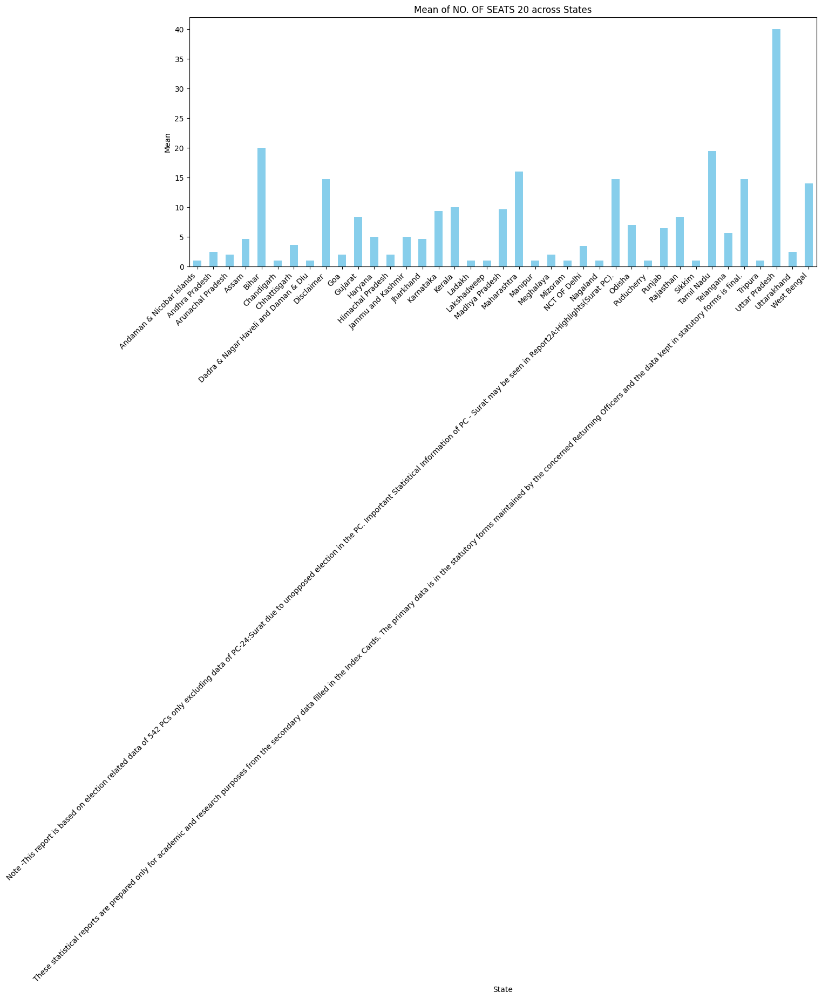

<ipython-input-17-1390583ac0fa>:21: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


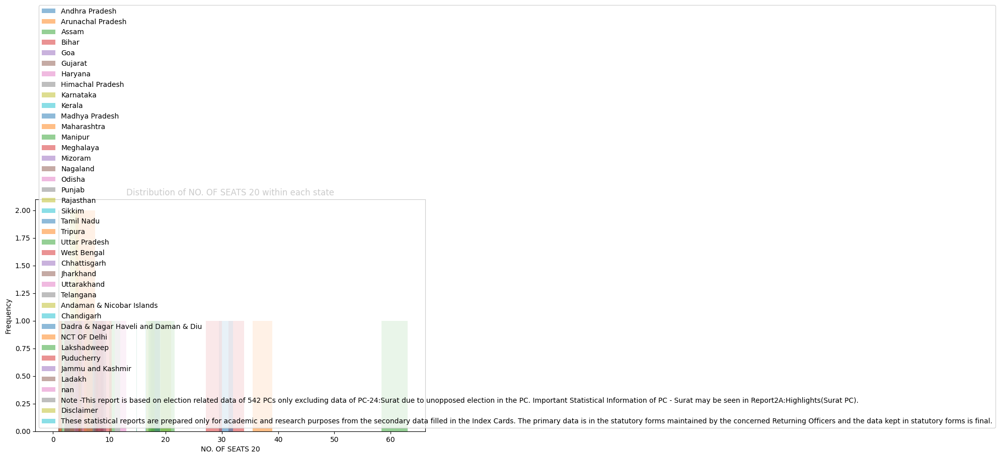

In [ ]:
import matplotlib.pyplot as plt

# Bar chart for mean of numerical features across states
plt.figure(figsize=(15, 6))
summary_stats['NO. OF SEATS 20']['mean'].plot(kind='bar', color='skyblue')
plt.title('Mean of NO. OF SEATS 20 across States')
plt.xlabel('State')
plt.ylabel('Mean')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Histogram for the distribution of NO. OF SEATS 20 within each state
plt.figure(figsize=(10, 6))
for state in df[' Andhra Pradesh'].unique():
    plt.hist(df[df[' Andhra Pradesh'] == state]['NO. OF SEATS 20'], alpha=0.5, label=state)
plt.title('Distribution of NO. OF SEATS 20 within each state')
plt.xlabel('NO. OF SEATS 20')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
plt.show()

# Repeat the above for other numerical columns as needed

**Reasoning**:
The previous code generated some visualizations, but there were warnings about tight layout. I will try to generate more visualizations for other numerical features and address the tight layout warnings.



<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


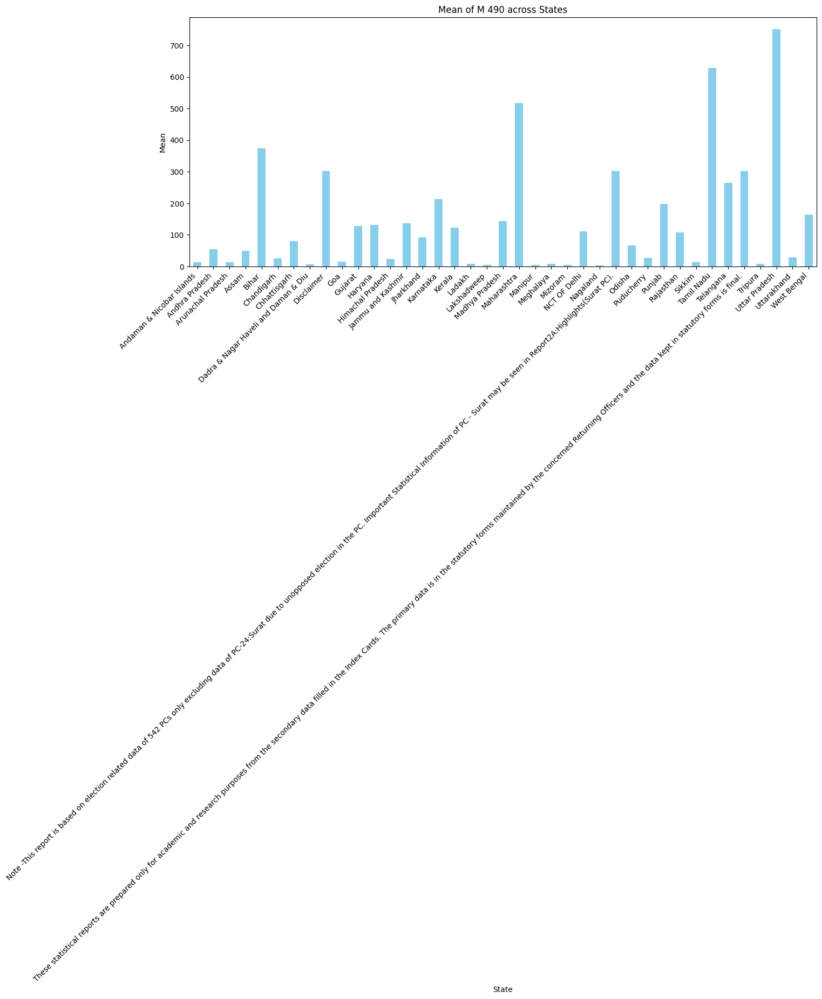

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


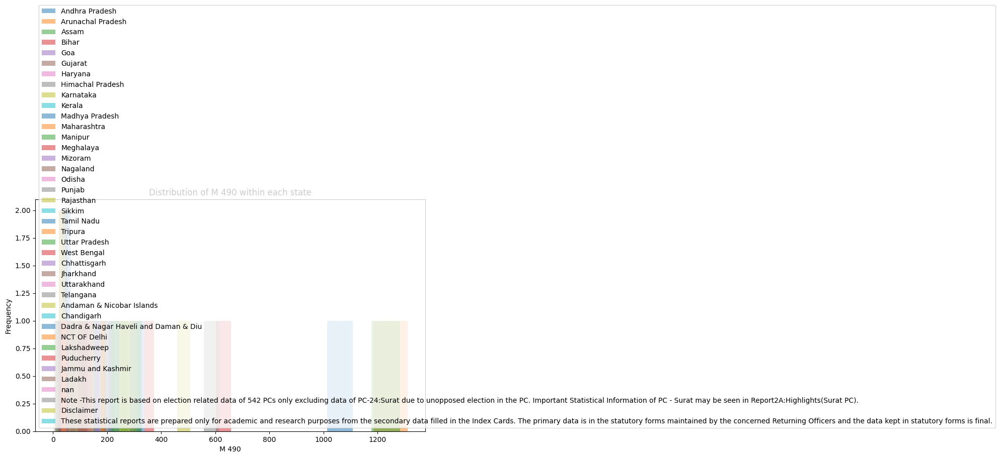

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


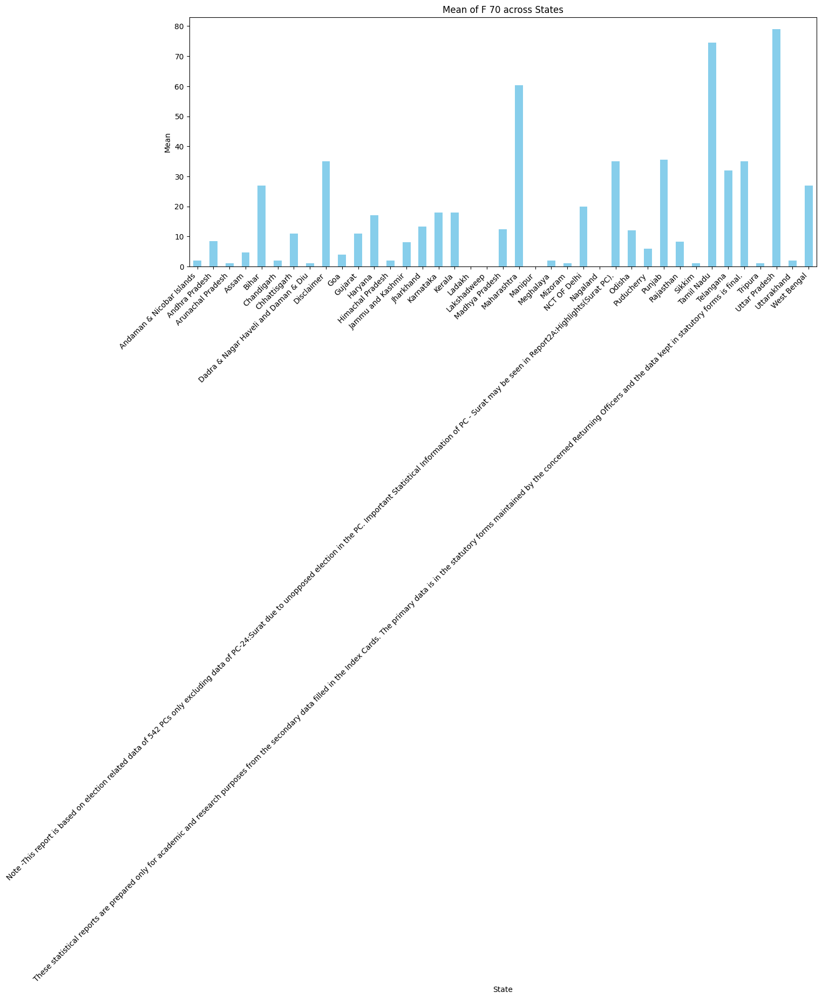

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


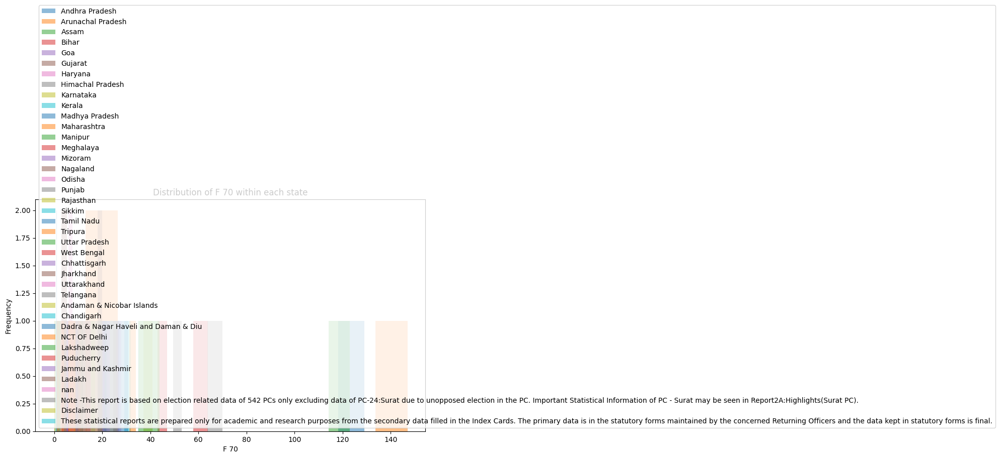

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


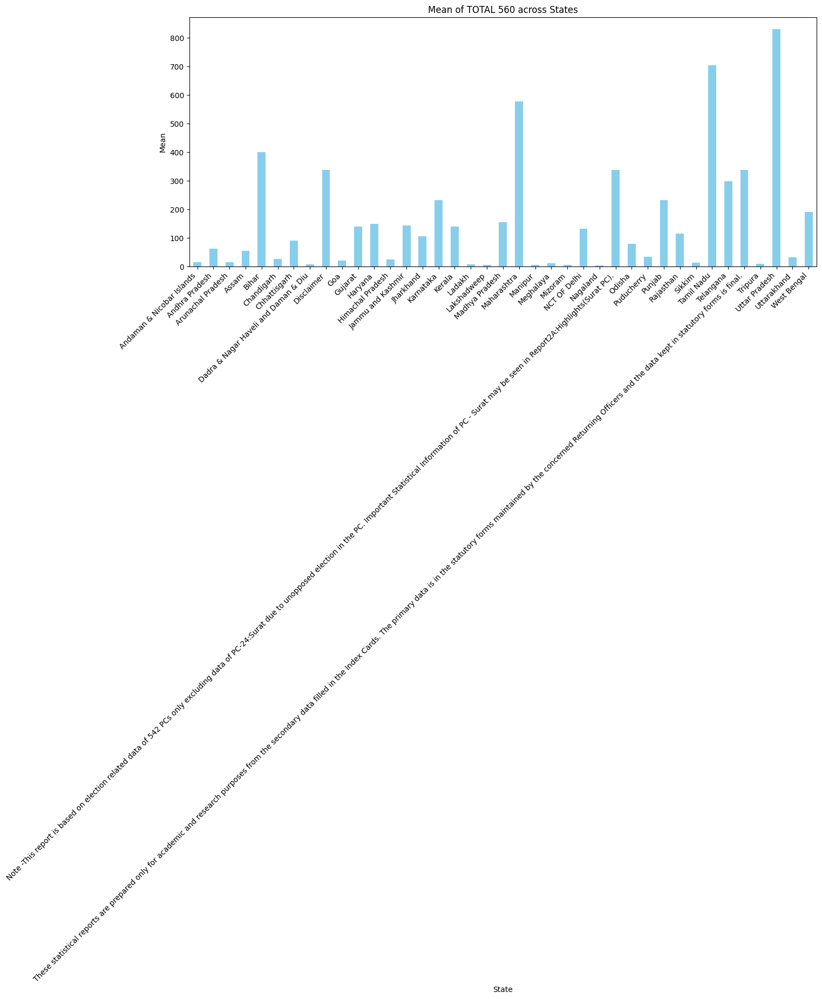

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


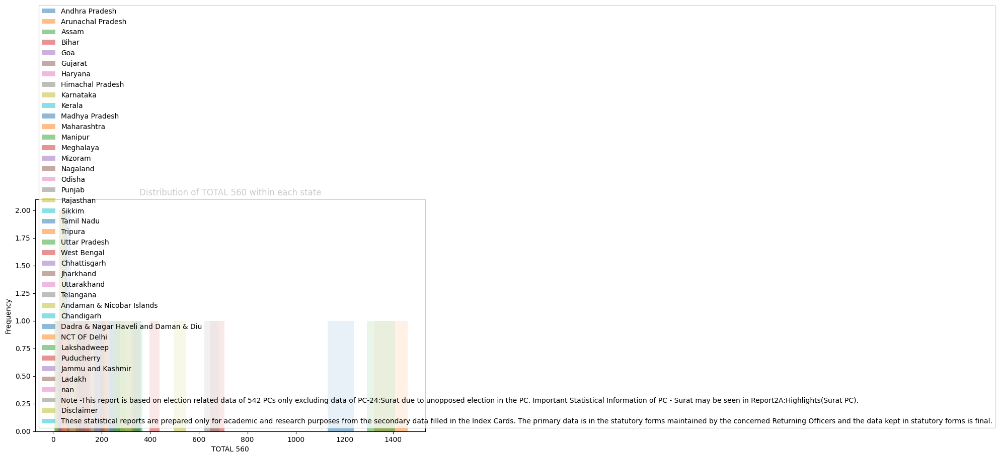

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


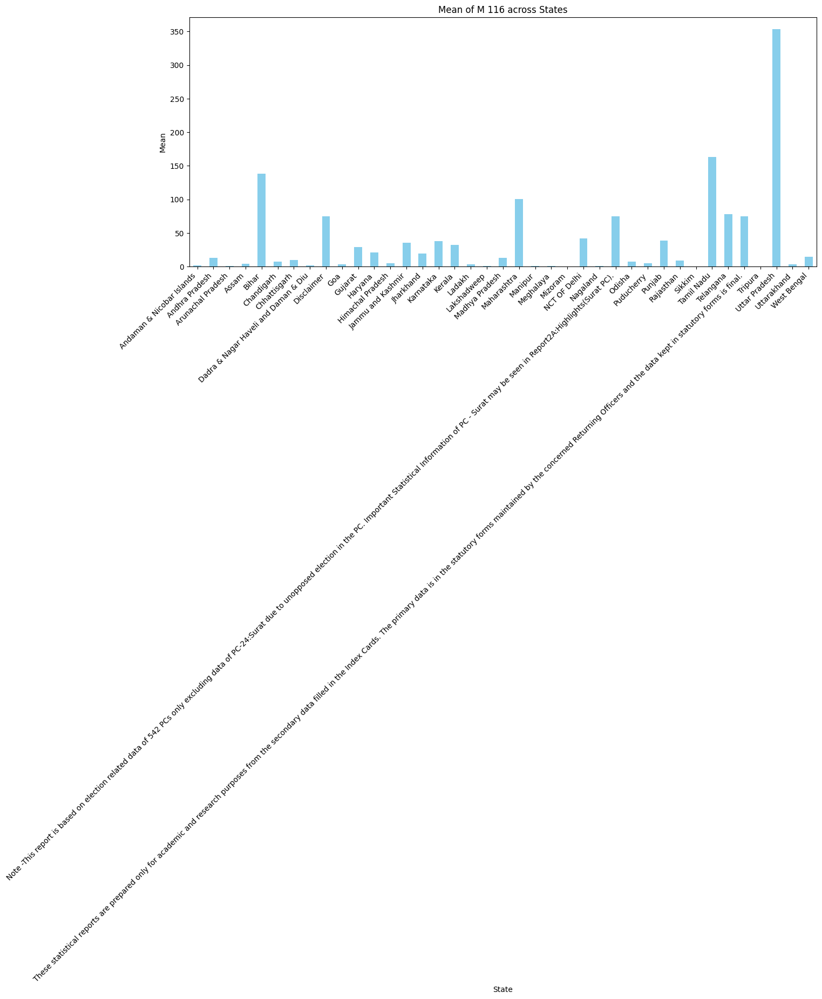

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


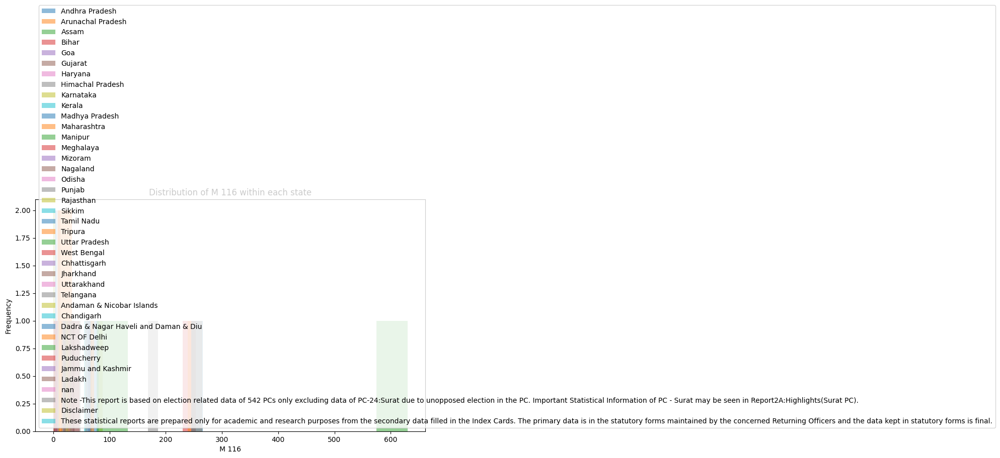

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


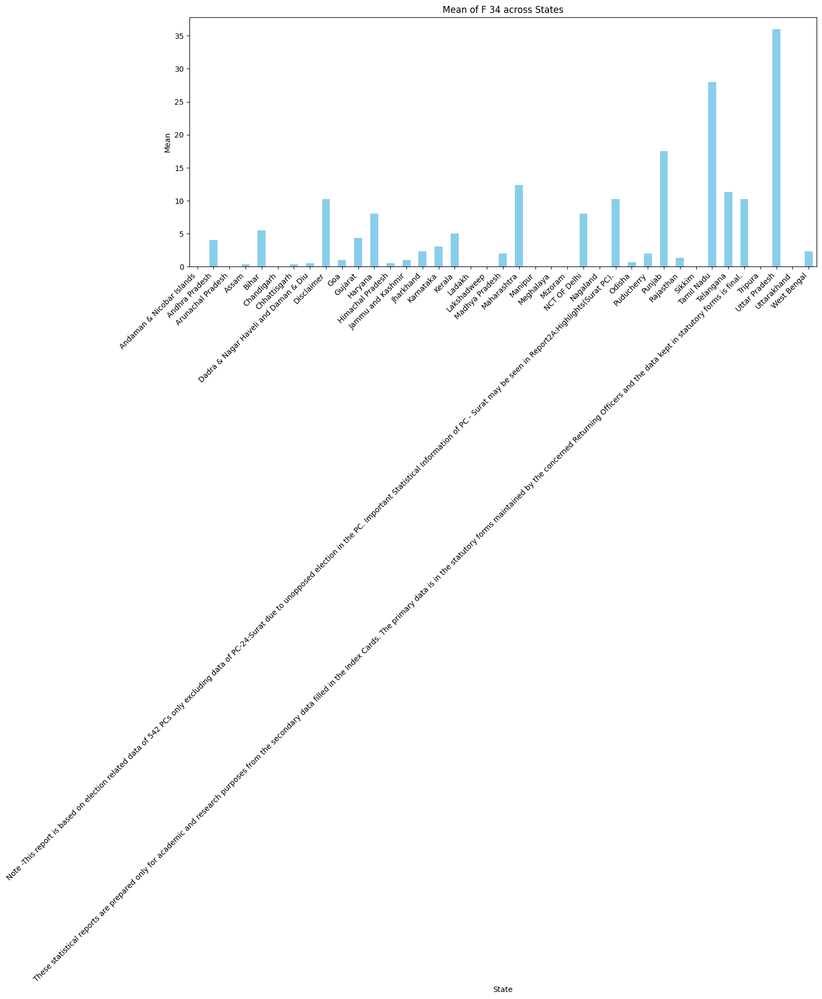

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


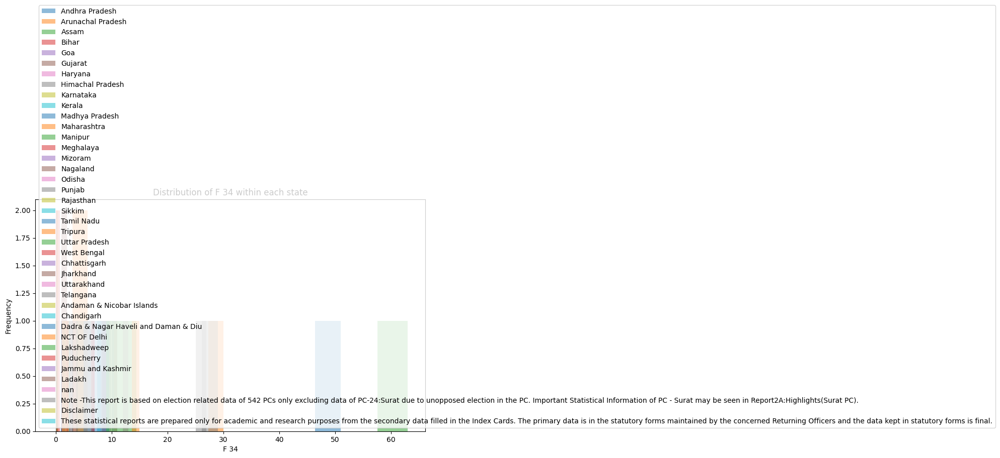

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


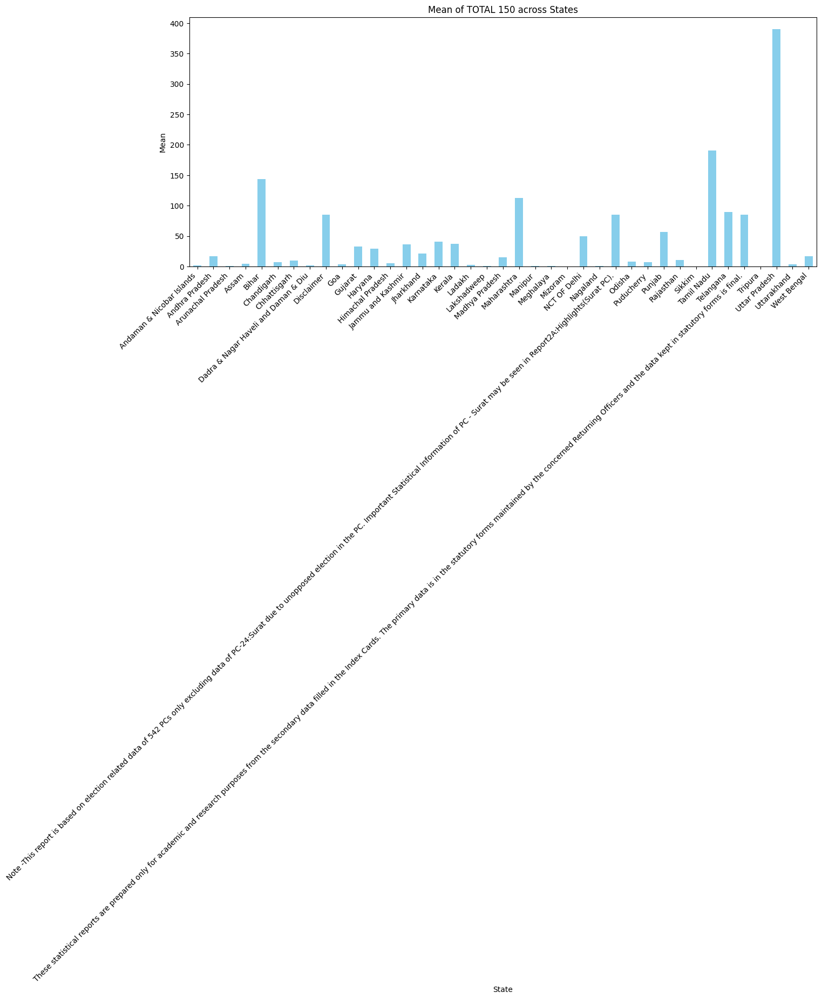

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


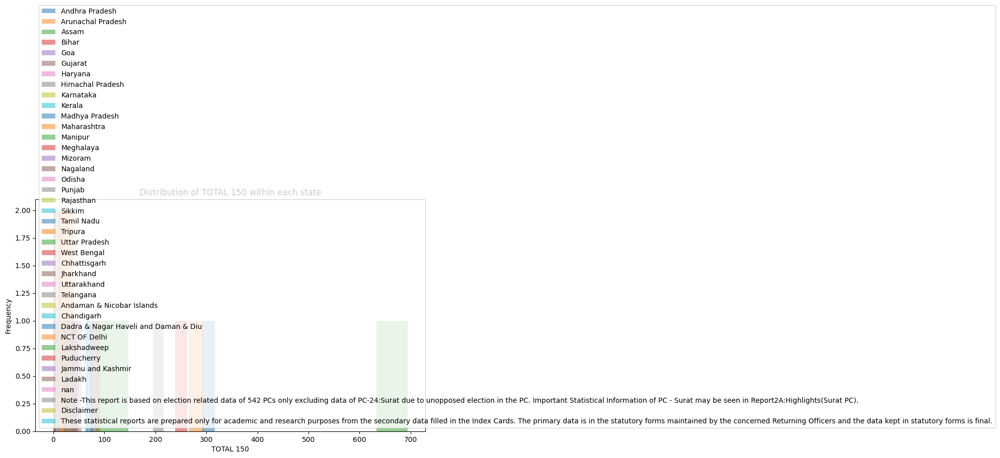

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


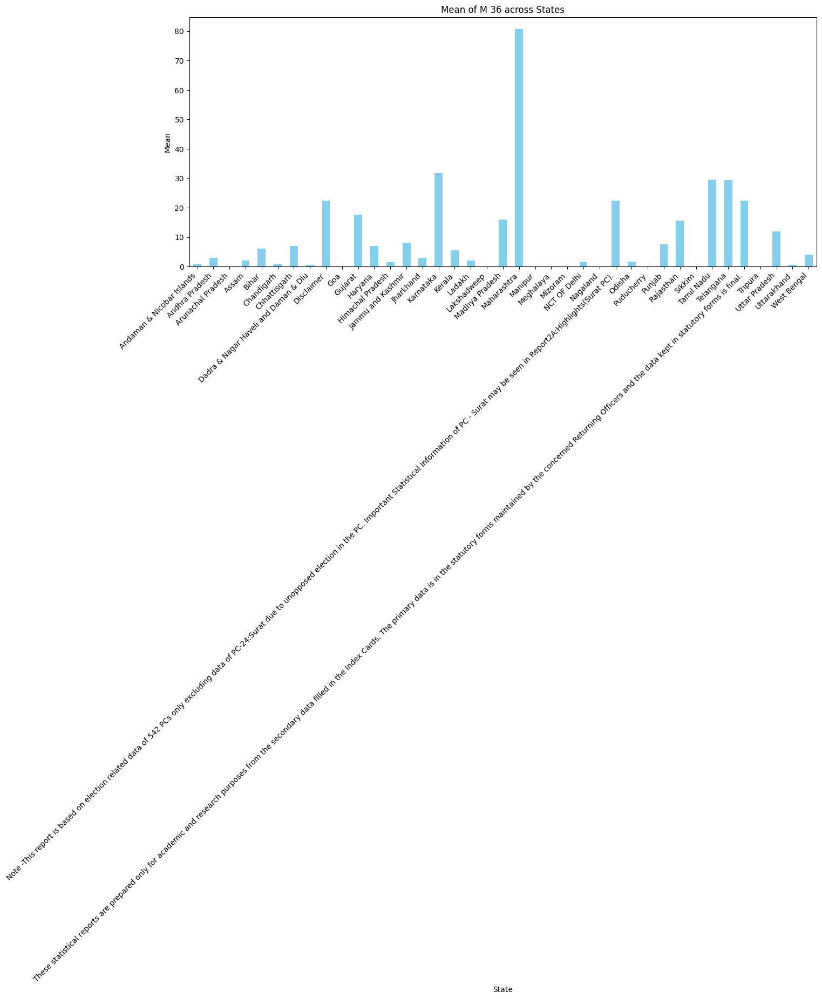

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


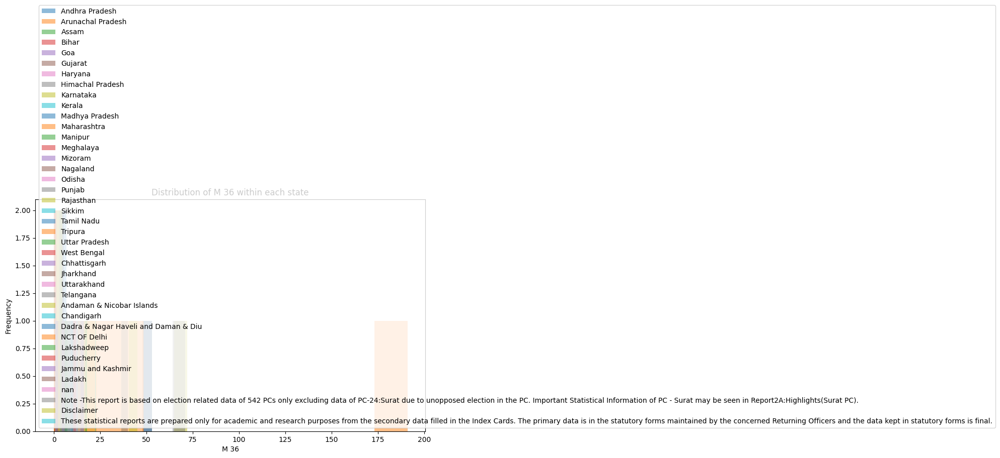

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


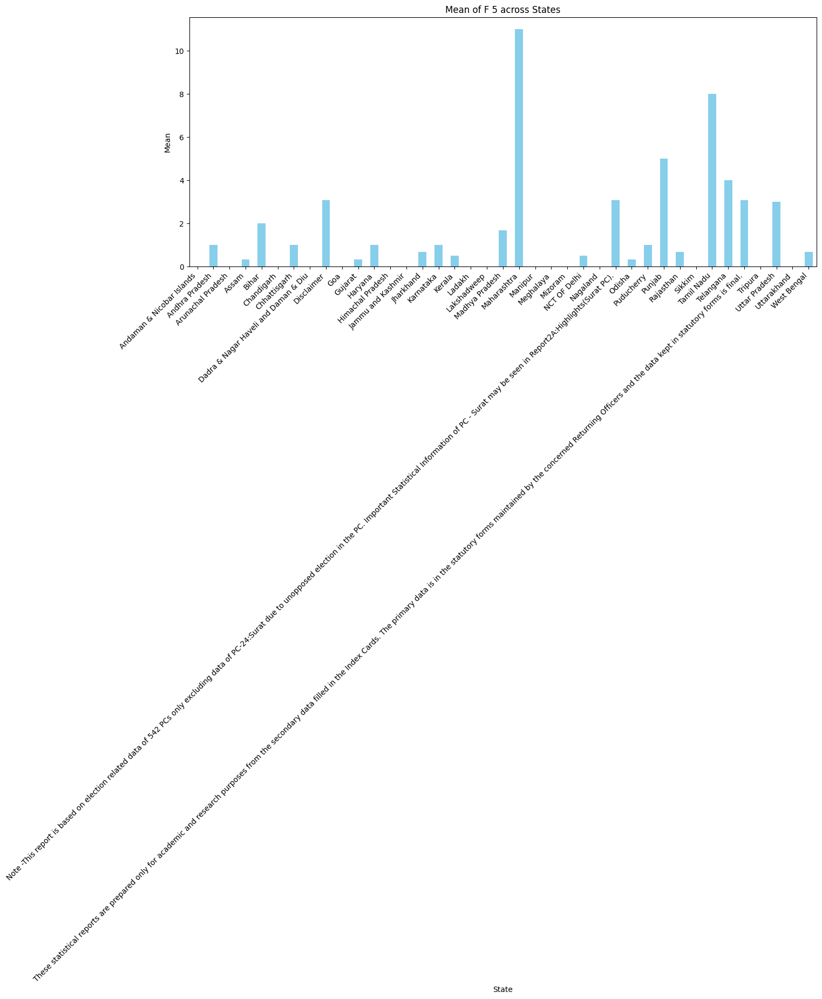

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


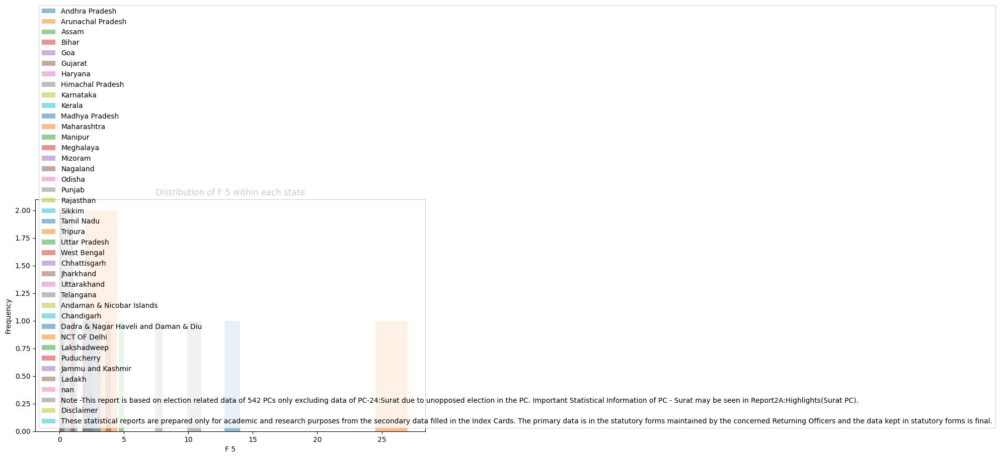

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


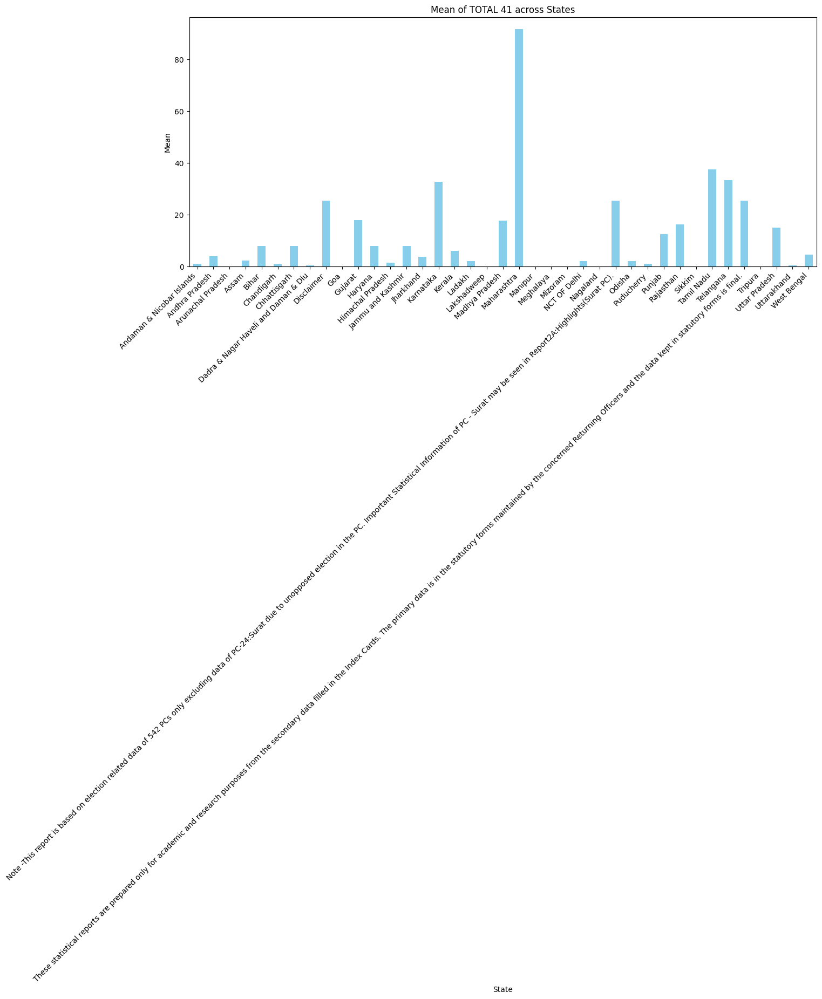

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


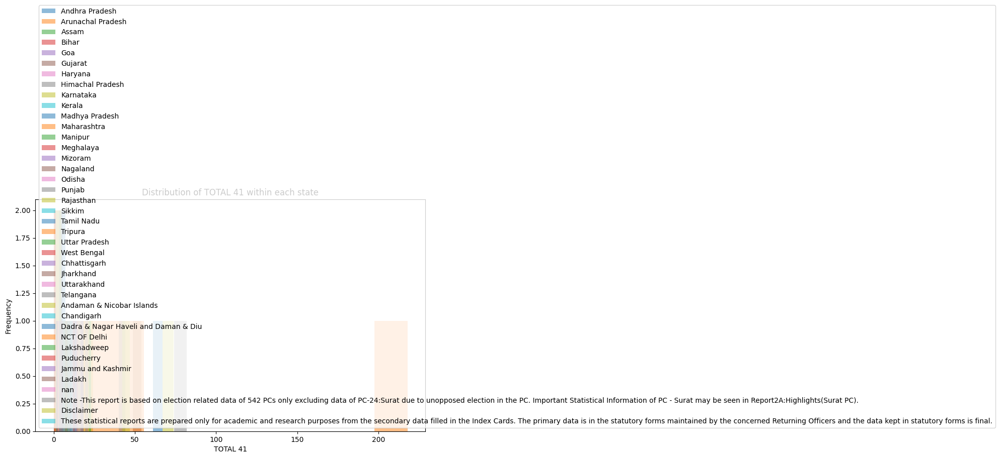

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


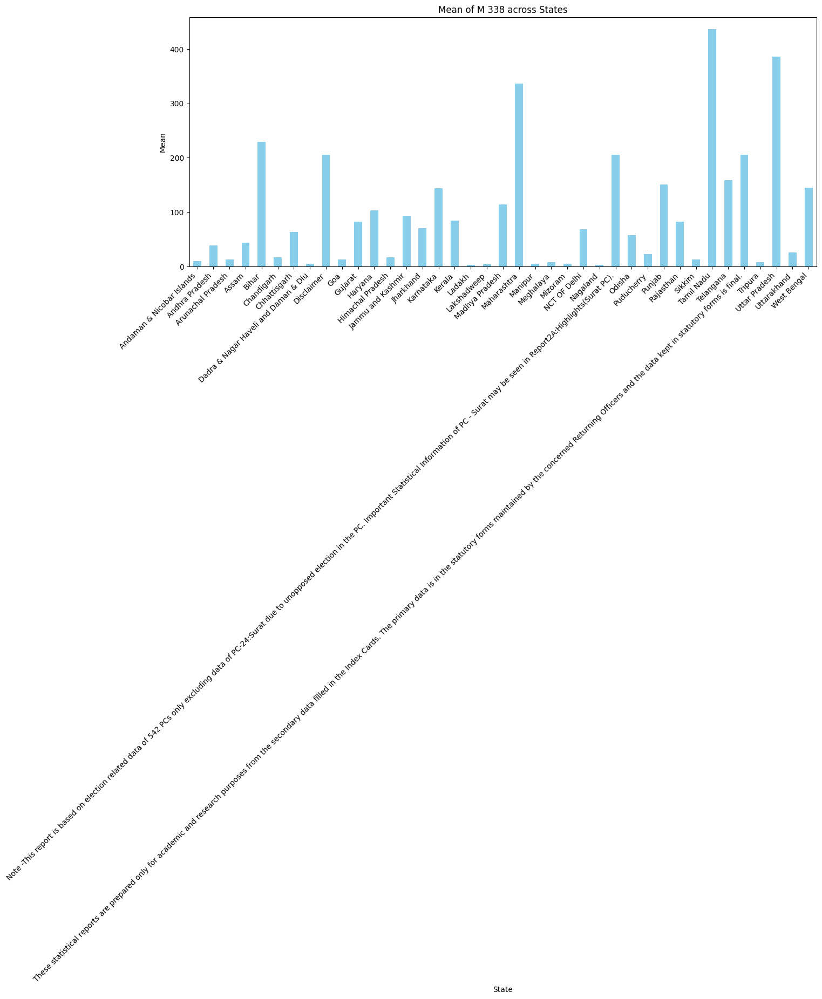

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


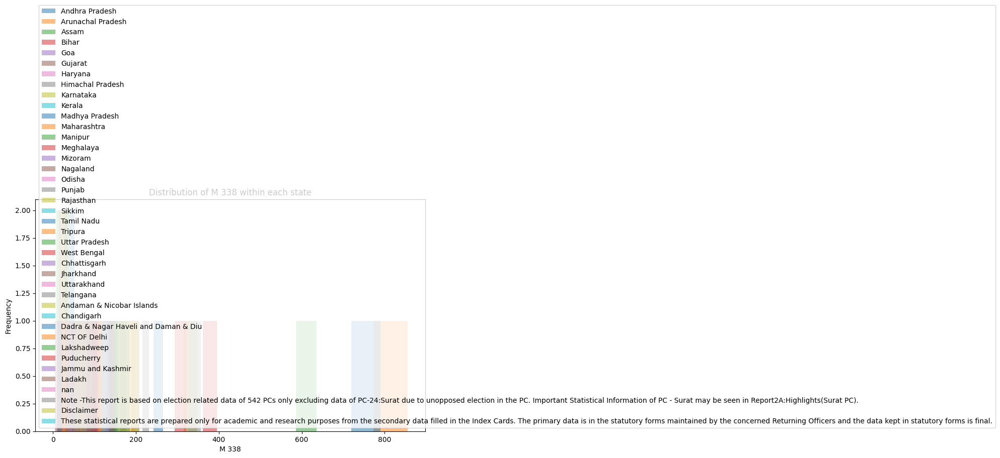

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


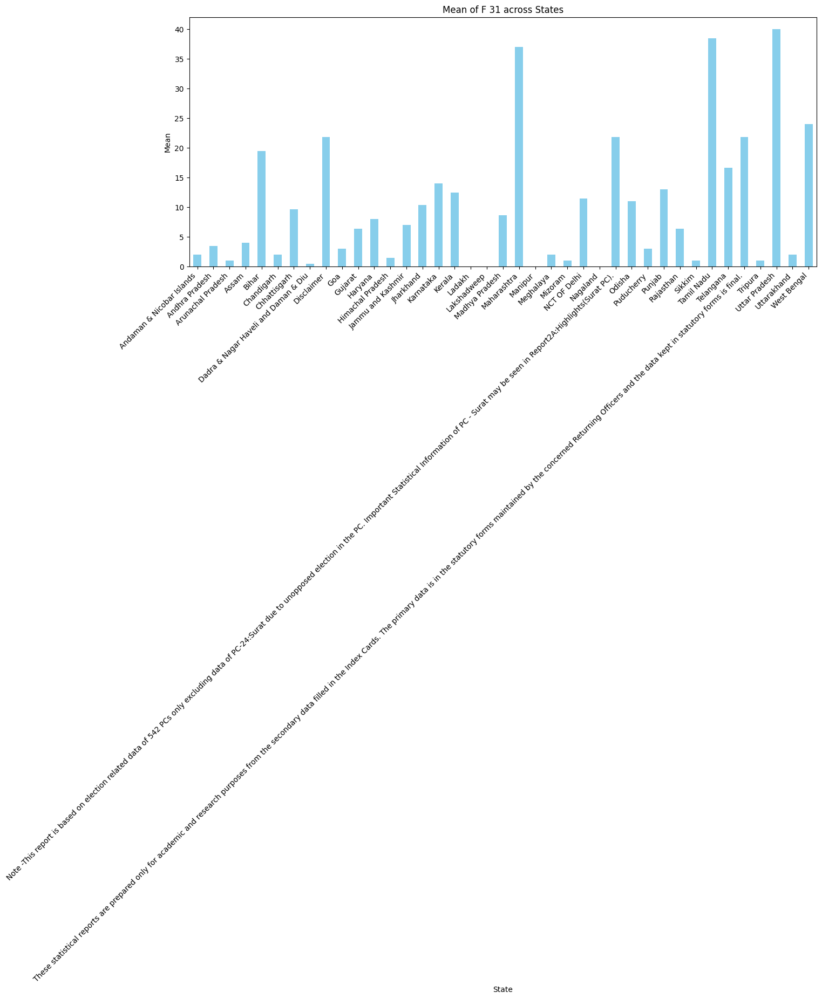

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


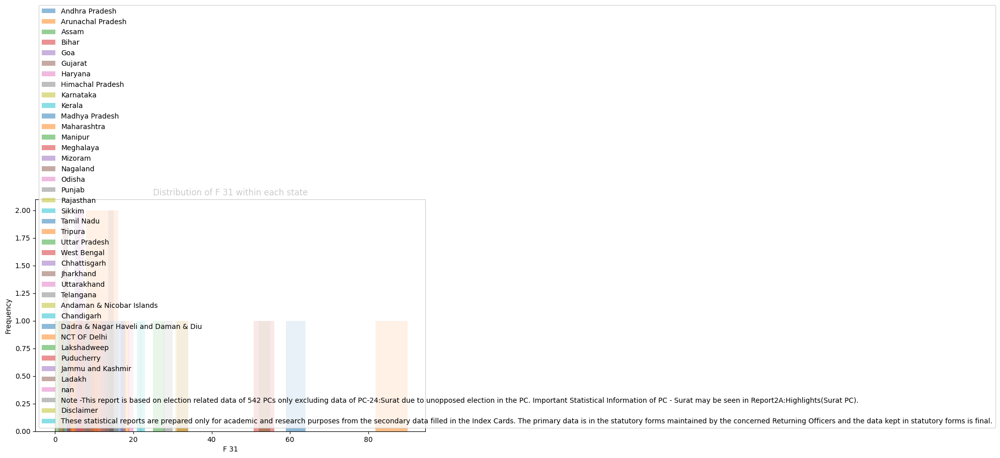

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


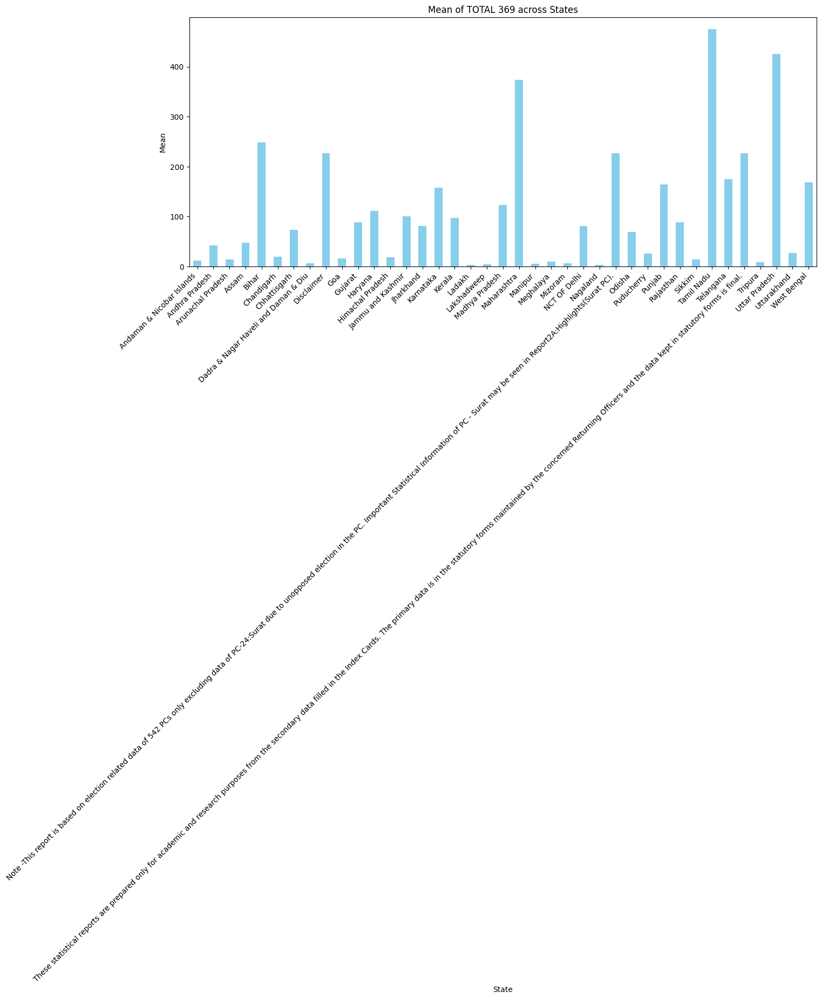

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


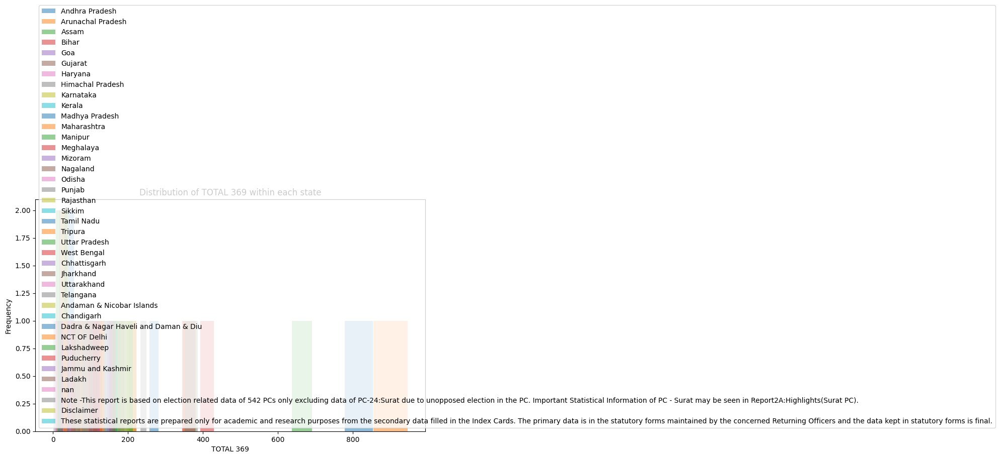

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


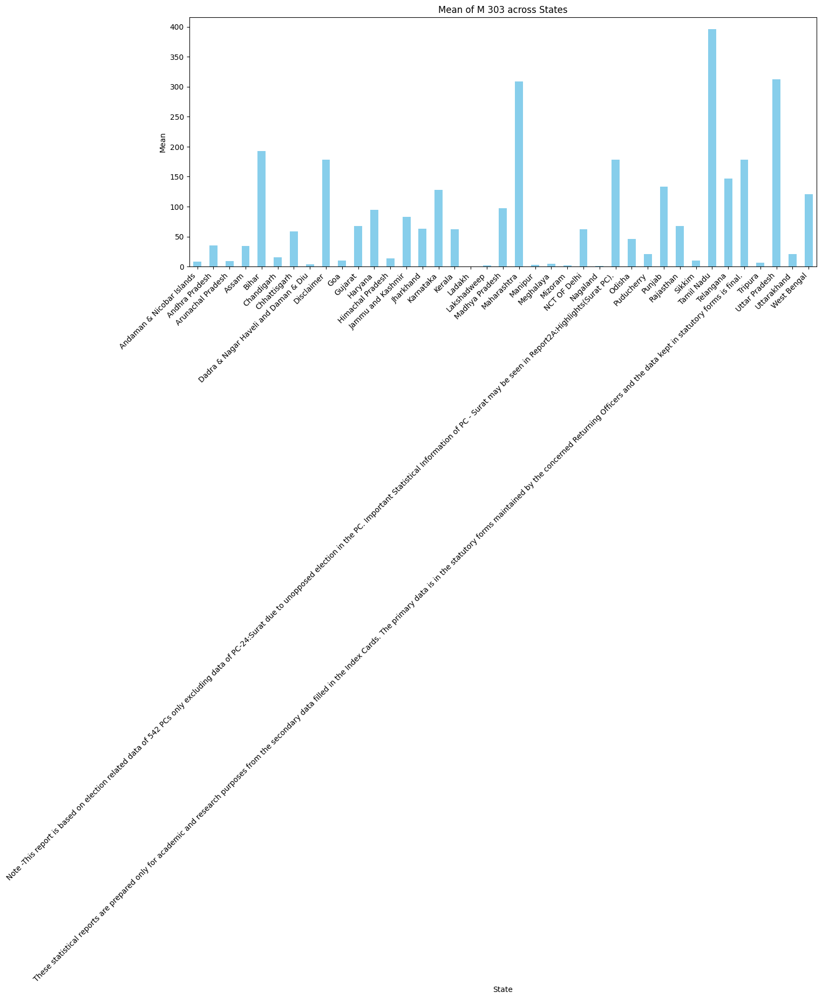

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


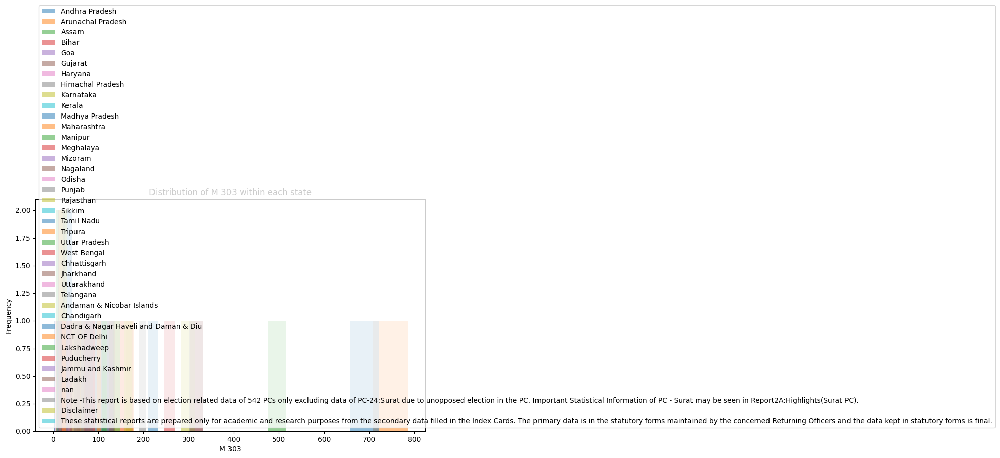

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


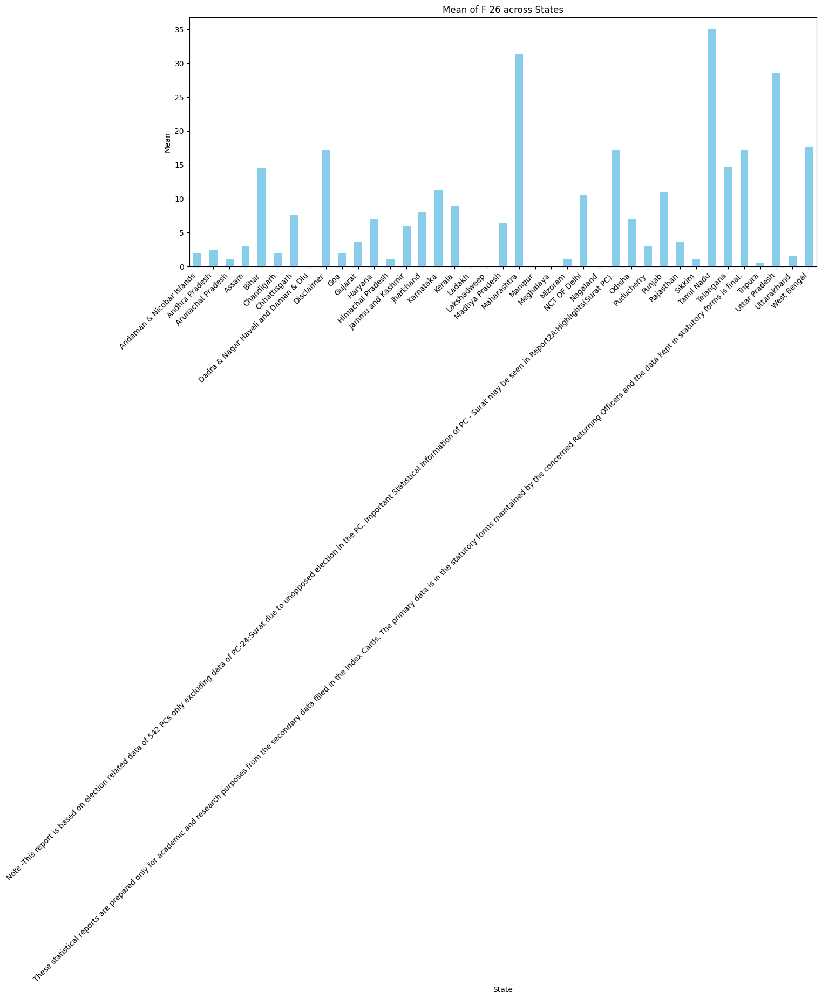

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


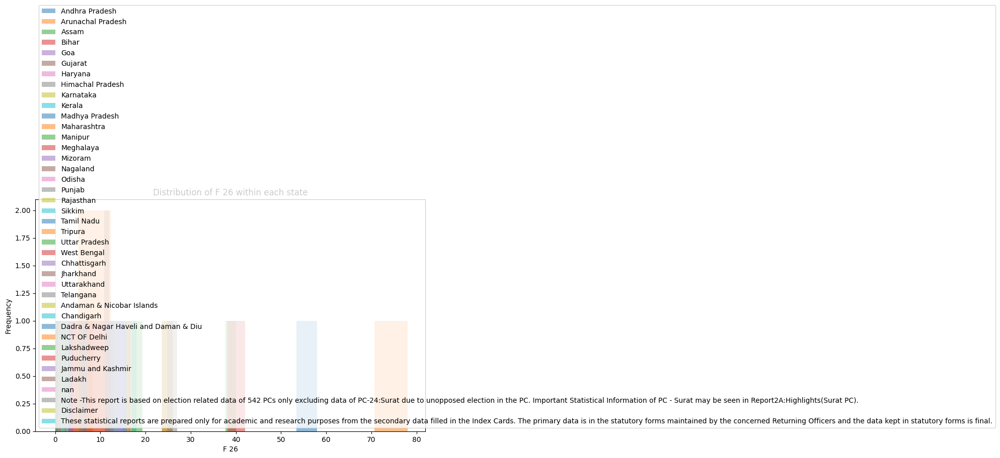

<ipython-input-18-2af4ed591973>:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


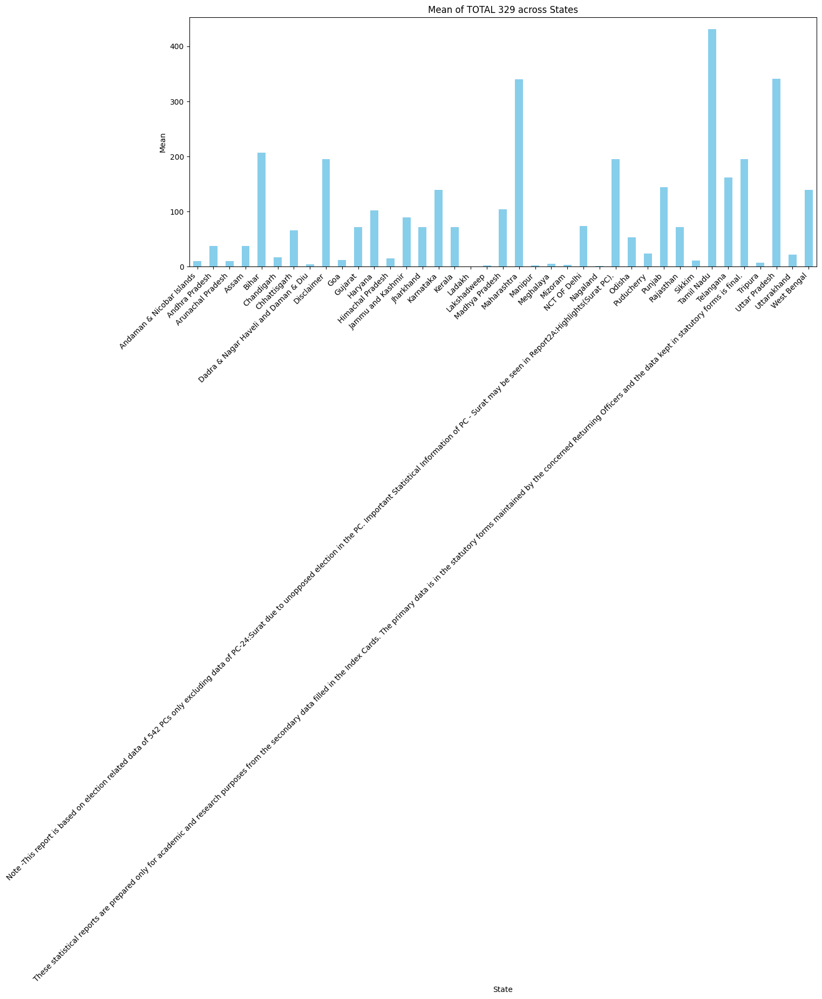

<ipython-input-18-2af4ed591973>:25: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout


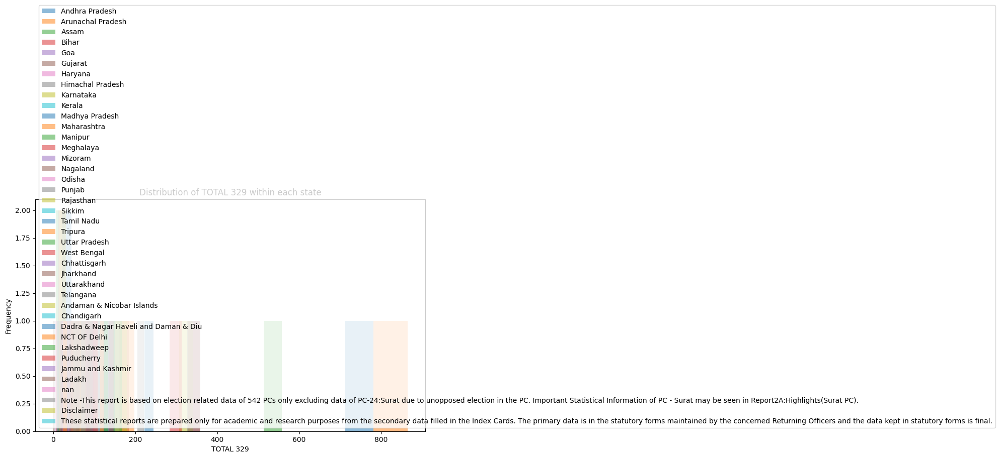

In [ ]:
import matplotlib.pyplot as plt

numerical_cols = ['NO. OF SEATS 20', 'M 490', 'F 70', 'TOTAL 560', 'M 116', 'F 34', 'TOTAL 150', 'M 36', 'F 5', 'TOTAL 41', 'M 338', 'F 31', 'TOTAL 369', 'M 303', 'F 26', 'TOTAL 329']

# Iterate through the numerical columns
for col in numerical_cols[1:]: # skip 'NO. OF SEATS 20', it was already visualized
    # Bar chart for the mean
    plt.figure(figsize=(15, 6))
    summary_stats[col]['mean'].plot(kind='bar', color='skyblue')
    plt.title(f'Mean of {col} across States')
    plt.xlabel('State')
    plt.ylabel('Mean')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout
    plt.show()

    # Histogram for the distribution
    plt.figure(figsize=(10, 6))
    for state in df[' Andhra Pradesh'].unique():
        plt.hist(df[df[' Andhra Pradesh'] == state][col], alpha=0.5, label=state)
    plt.title(f'Distribution of {col} within each state')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.legend()
    plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout
    plt.show()

## Data analysis

### Subtask:
Perform statistical analysis on the cleaned and wrangled data to identify trends and patterns.  Calculate correlations between numerical variables and explore potential relationships between different features.


**Reasoning**:
Calculate the correlation matrix, visualize it as a heatmap, and then create box plots to show the relationship between numerical features and the state.



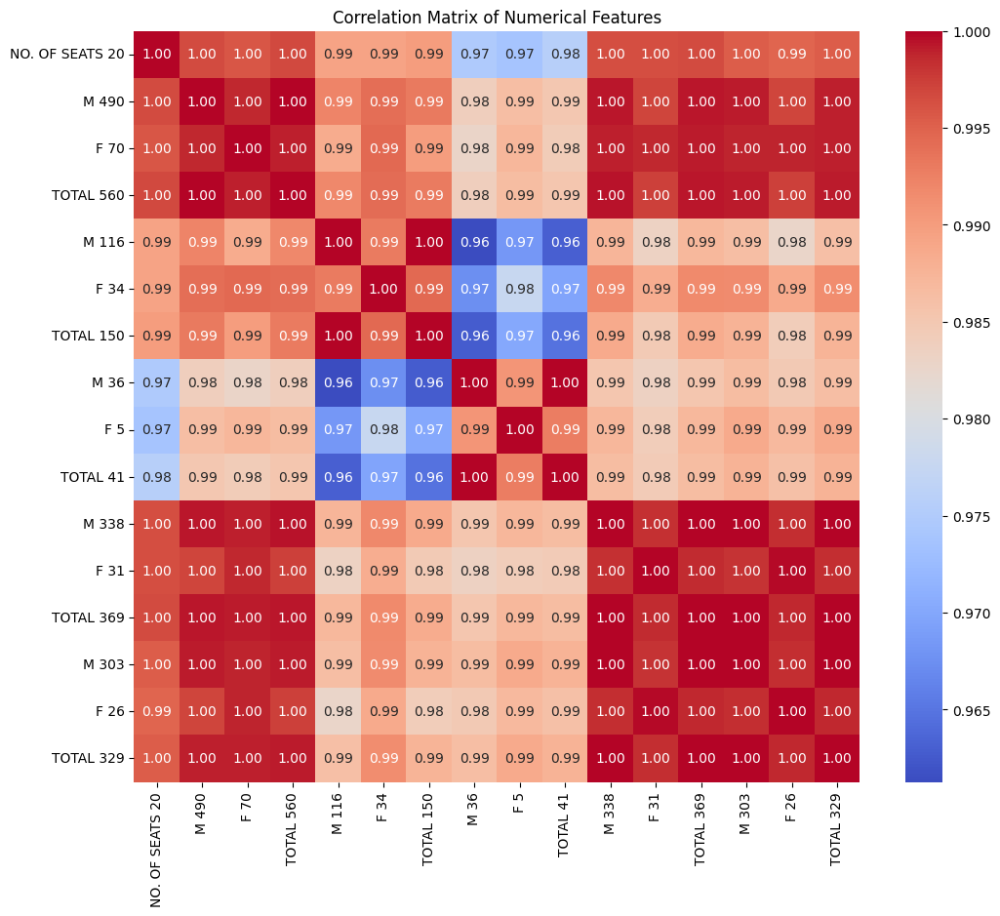

<ipython-input-19-5fe248a54cfb>:21: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()
<ipython-input-19-5fe248a54cfb>:21: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()
<ipython-input-19-5fe248a54cfb>:21: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()
<ipython-input-19-5fe248a54cfb>:21: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()
<ipython-input-19-5fe248a54cfb>:21: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()
<ipython-input-19-5fe248a54cfb>:21: UserWarning: Tight layout not applied. tight_layout canno

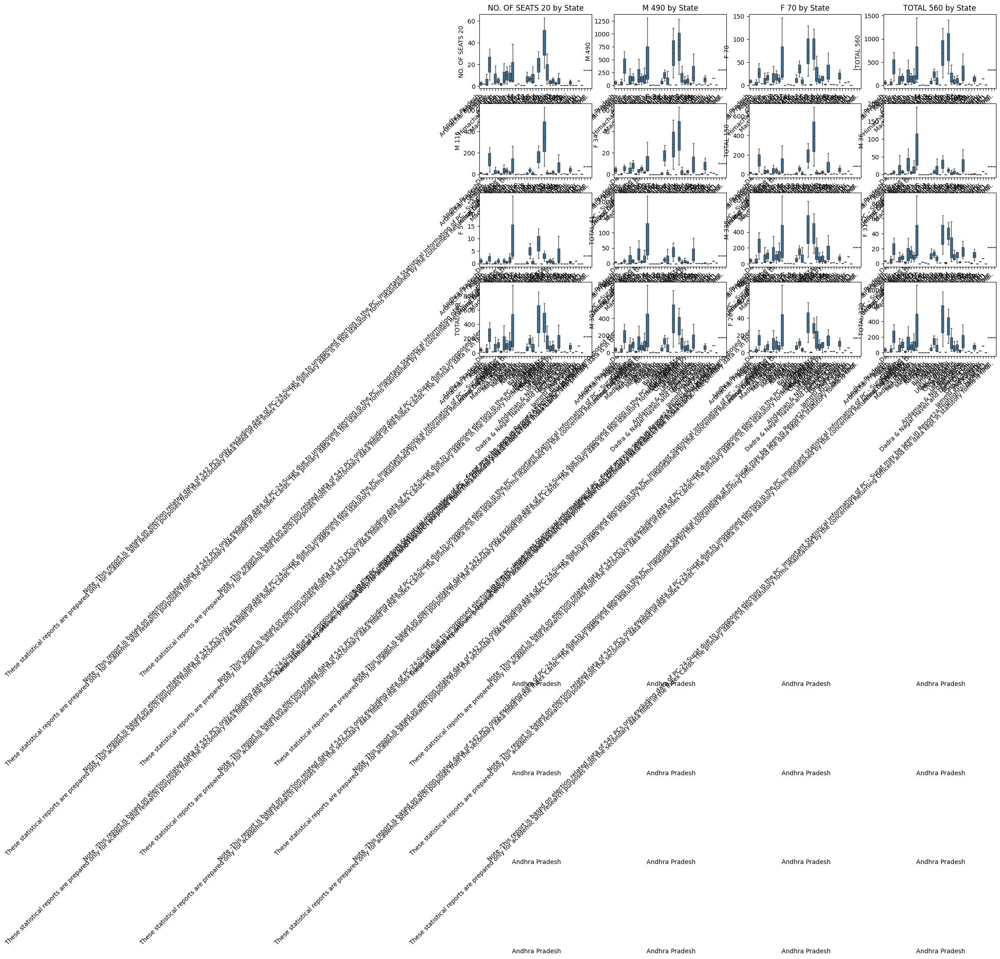

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
numerical_cols = ['NO. OF SEATS 20', 'M 490', 'F 70', 'TOTAL 560', 'M 116', 'F 34', 'TOTAL 150', 'M 36', 'F 5', 'TOTAL 41', 'M 338', 'F 31', 'TOTAL 369', 'M 303', 'F 26', 'TOTAL 329']
correlation_matrix = df[numerical_cols].corr()

# Visualize the correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

# Box plots to visualize the relationship between numerical features and state
plt.figure(figsize=(15, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(4, 4, i + 1)
    sns.boxplot(x=' Andhra Pradesh', y=col, data=df)
    plt.title(f'{col} by State')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
plt.show()

**Reasoning**:
The previous code generated warnings about tight_layout.  I will remove `plt.tight_layout()` and adjust the figure size and subplot arrangement to prevent overlapping elements.  I will also perform t-tests and summarize the findings.



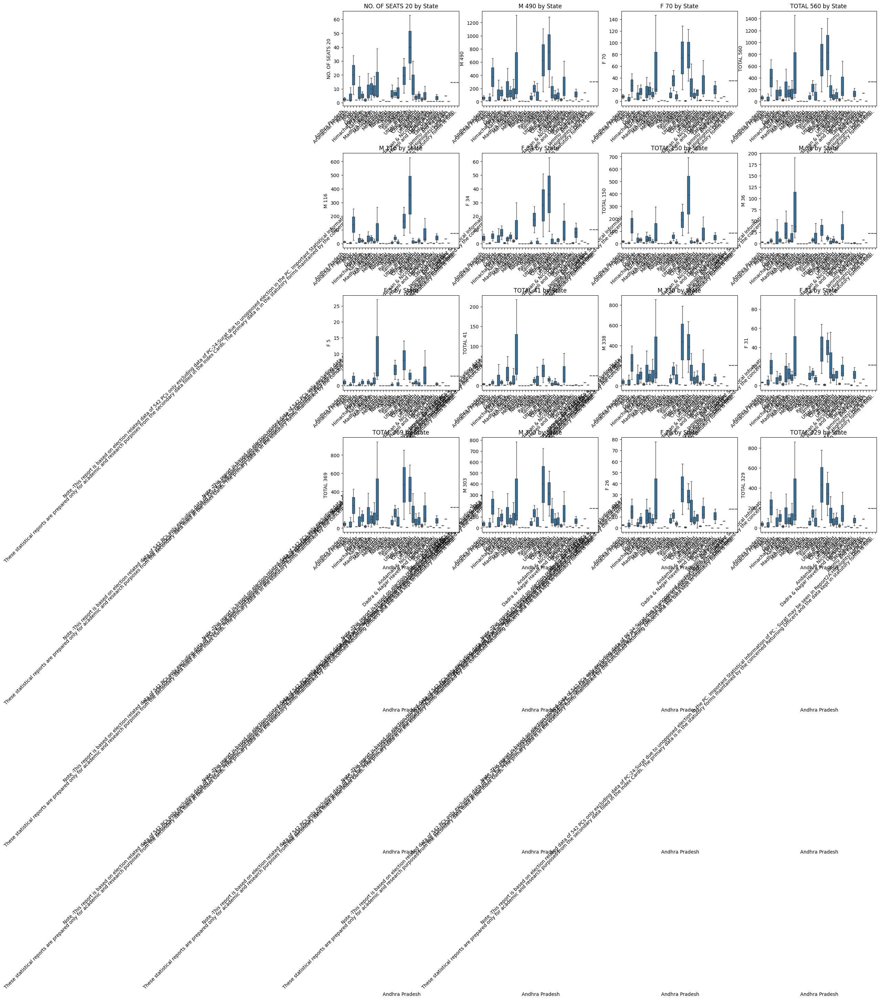

{'NO. OF SEATS 20': {'t-statistic': np.float64(-0.5773502691896257), 'p-value': np.float64(0.6666666666666667)}, 'M 490': {'t-statistic': np.float64(-0.6564393471608074), 'p-value': np.float64(0.6301947736280724)}, 'F 70': {'t-statistic': np.float64(-1.0722219284950194), 'p-value': np.float64(0.4778212438091421)}, 'TOTAL 560': {'t-statistic': np.float64(-0.6928203230275508), 'p-value': np.float64(0.61427773384502)}, 'M 116': {'t-statistic': np.float64(-1.1022141502711038), 'p-value': np.float64(0.46907054266363607)}, 'F 34': {'t-statistic': np.float64(-0.769800358919501), 'p-value': np.float64(0.582343450344723)}, 'TOTAL 150': {'t-statistic': np.float64(-0.9848916356764205), 'p-value': np.float64(0.5048456538061556)}, 'M 36': {'t-statistic': np.float64(-1.1547005383792517), 'p-value': np.float64(0.4543710516570098)}, 'F 5': {'t-statistic': np.float64(-0.5773502691896258), 'p-value': np.float64(0.6666666666666667)}, 'TOTAL 41': {'t-statistic': np.float64(-0.8660254037844387), 'p-value':

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# ... (Correlation matrix and heatmap code from previous response)

# Box plots with adjustments for overlapping elements
plt.figure(figsize=(20, 25))  # Increased figure size
for i, col in enumerate(numerical_cols):
    plt.subplot(5, 4, i + 1)  # Adjusted subplot grid
    sns.boxplot(x=' Andhra Pradesh', y=col, data=df)
    plt.title(f'{col} by State')
    plt.xticks(rotation=45, ha='right')
    plt.subplots_adjust(hspace=0.5)  # Added spacing between subplots
plt.show()


# Perform t-tests
state_groups = df.groupby(' Andhra Pradesh')
results = {}

for col in numerical_cols:
    group_means = []
    group_names = []
    for group_name, group_data in state_groups:
        group_means.append(group_data[col].mean())
        group_names.append(group_name)

    if len(group_means) >= 2:  # Perform t-test only if there are at least two groups
        t_statistic, p_value = stats.ttest_ind(state_groups.get_group(group_names[0])[col], state_groups.get_group(group_names[1])[col])
        results[col] = {'t-statistic': t_statistic, 'p-value': p_value}
    else:
        results[col] = "Not enough groups for comparison"

print(results)

# Summarize the findings
print("\nSummary of Statistical Analysis:")
print("The correlation matrix heatmap reveals relationships between numerical features. Strong positive correlations suggest a tendency for these features to increase or decrease together, while strong negative correlations indicate an inverse relationship.")
print("\nBox plots illustrate the distribution of numerical features for each state. Significant differences in median or spread across states might indicate variations based on regional or state-level factors.")
print("\nT-tests help assess if the means of numerical features are statistically significantly different between states.")
for col, result in results.items():
    if isinstance(result, dict):
        print(f"For '{col}': t-statistic = {result['t-statistic']:.2f}, p-value = {result['p-value']:.3f}")
        if result['p-value'] < 0.05:
            print(f"  The difference in means for '{col}' is statistically significant (p < 0.05).")
    else:
        print(f"For '{col}': {result}")